# Application of Analytics


In [2]:
import pandas as pd

In [3]:
df = pd.read_csv('BostonHousing.csv')

In [4]:
df

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273,21.0,393.45,6.48,22.0


# About the dataset

The Boston Housing Dataset

The Boston Housing Dataset is a derived from information collected by the U.S. Census Service concerning housing in the area of Boston MA. The following describes the dataset columns:

- CRIM - per capita crime rate by town
- ZN - proportion of residential land zoned for lots over 25,000 sq.ft.
- INDUS - proportion of non-retail business acres per town.
- CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise)
- NOX - nitric oxides concentration (parts per 10 million)
- RM - average number of rooms per dwelling
- AGE - proportion of owner-occupied units built prior to 1940
- DIS - weighted distances to five Boston employment centres
- RAD - index of accessibility to radial highways
- TAX - full-value property-tax rate per 10,000
- PTRATIO - pupil-teacher ratio by town
- B - 1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
- LSTAT - % lower status of the population
- MEDV - Median value of owner-occupied homes in $1000's

# Problem Statement
As always, we start off with EDA.

- Give me some insights for this data.


# Let's Explore

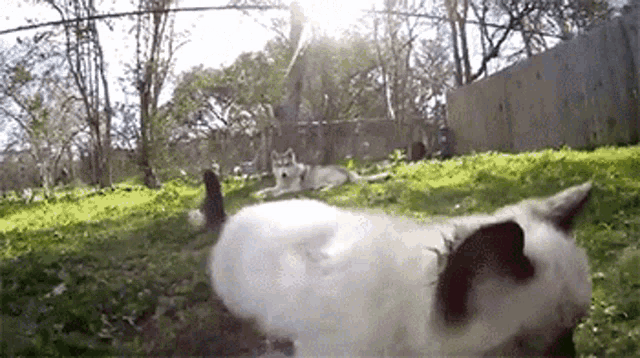

In [125]:
df.describe

<bound method NDFrame.describe of         crim    zn  indus  chas    nox     rm   age     dis  rad  tax  \
0    0.00632  18.0   2.31     0  0.538  6.575  65.2  4.0900    1  296   
1    0.02731   0.0   7.07     0  0.469  6.421  78.9  4.9671    2  242   
2    0.02729   0.0   7.07     0  0.469  7.185  61.1  4.9671    2  242   
3    0.03237   0.0   2.18     0  0.458  6.998  45.8  6.0622    3  222   
4    0.06905   0.0   2.18     0  0.458  7.147  54.2  6.0622    3  222   
..       ...   ...    ...   ...    ...    ...   ...     ...  ...  ...   
501  0.06263   0.0  11.93     0  0.573  6.593  69.1  2.4786    1  273   
502  0.04527   0.0  11.93     0  0.573  6.120  76.7  2.2875    1  273   
503  0.06076   0.0  11.93     0  0.573  6.976  91.0  2.1675    1  273   
504  0.10959   0.0  11.93     0  0.573  6.794  89.3  2.3889    1  273   
505  0.04741   0.0  11.93     0  0.573  6.030  80.8  2.5050    1  273   

     ptratio       b  lstat  medv  
0       15.3  396.90   4.98  24.0  
1       17.8  396

In [124]:
df.dtypes

crim       float64
zn         float64
indus      float64
chas         int64
nox        float64
rm         float64
age        float64
dis        float64
rad          int64
tax          int64
ptratio    float64
b          float64
lstat      float64
medv       float64
dtype: object

In [5]:
df.isnull().sum()

crim       0
zn         0
indus      0
chas       0
nox        0
rm         0
age        0
dis        0
rad        0
tax        0
ptratio    0
b          0
lstat      0
medv       0
dtype: int64

# Visualization

## Importing Libraries

In [126]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.set_context('poster')

# Univariate Analysis

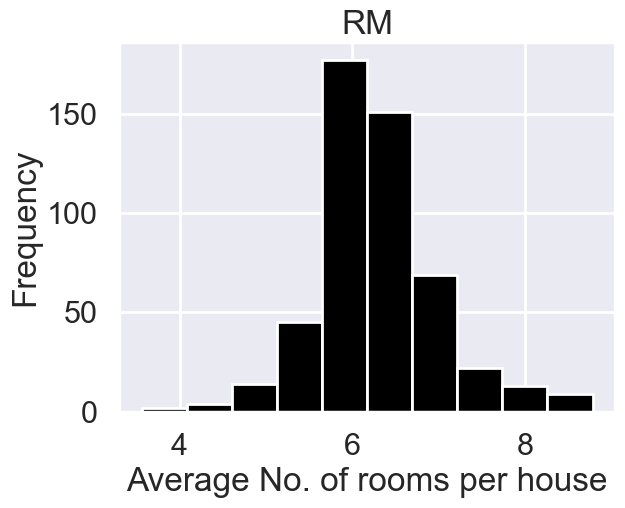

In [32]:
plt.hist(df['rm'],color='black')
plt.xlabel("Average No. of rooms per house")
plt.ylabel("Frequency")
plt.title("RM")
plt.show()

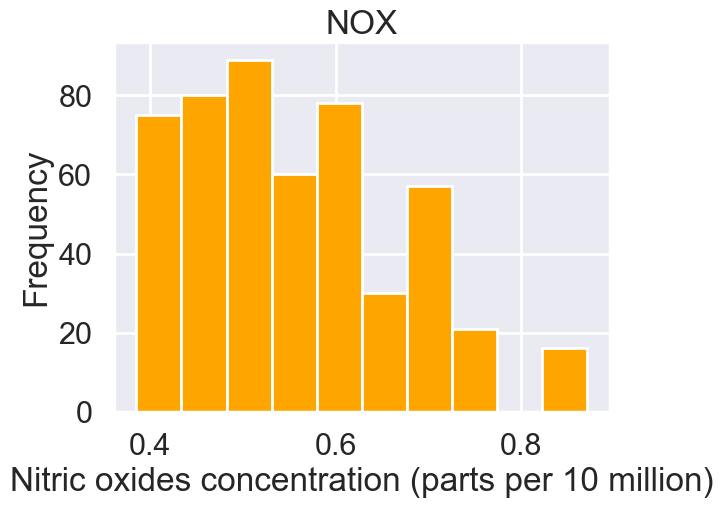

In [31]:
plt.hist(df.nox,color='orange')
plt.xlabel("Nitric oxides concentration (parts per 10 million)")
plt.ylabel("Frequency")
plt.title("NOX")
plt.show()

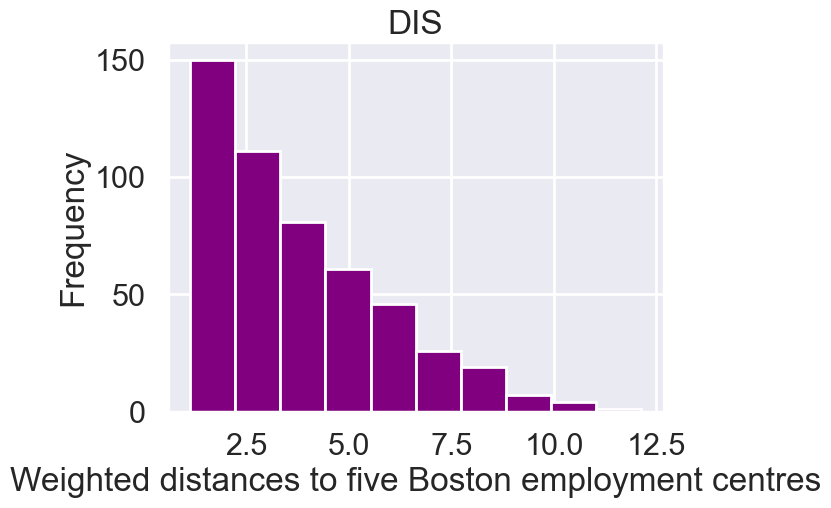

In [30]:
plt.hist(df.dis, color='purple')
plt.xlabel("Weighted distances to five Boston employment centres")
plt.ylabel("Frequency")
plt.title("DIS")
plt.show()

<AxesSubplot:xlabel='medv', ylabel='Density'>

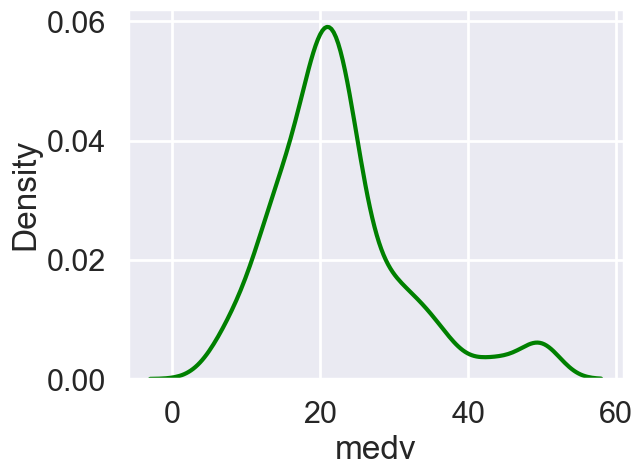

In [33]:
sns.kdeplot(df["medv"],color='green')

### The KDE plot is approximately bell-shaped, he median home values are distributed normally in the dataset

<AxesSubplot:xlabel='crim', ylabel='Count'>

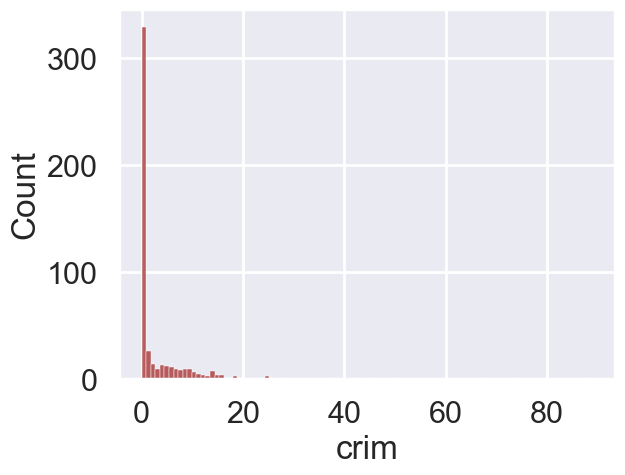

In [37]:
sns.histplot(df["crim"],color='brown')

### The histogram is skewed to the right, most of the crime rates are relatively low, with a few instances of high crime rates.

<AxesSubplot:xlabel='chas', ylabel='count'>

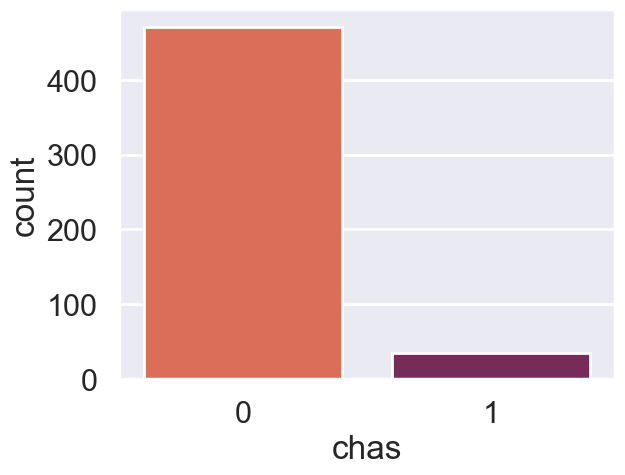

In [18]:
# The number of houses by neighborhood
sns.countplot(x="chas", data=df,palette= "rocket_r")

### There are more properties that are not adjacent to charles river 

# Bivariate Analysis

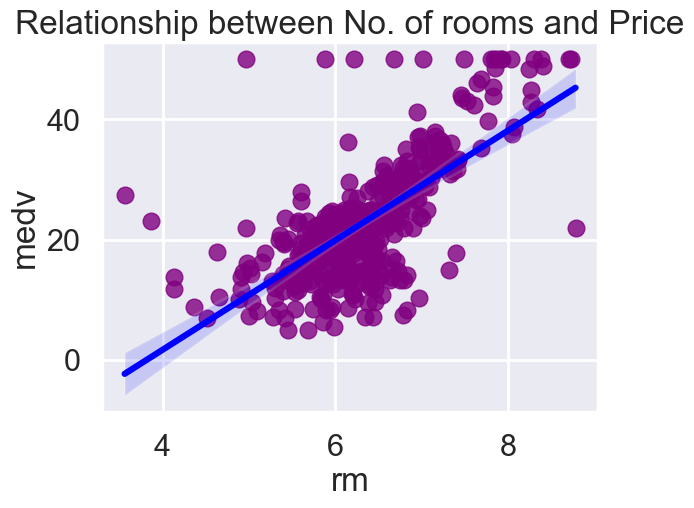

In [47]:
# Between prices and No. of rooms
sns.regplot(x="rm",y="medv", data=df, fit_reg=True,line_kws={'color': 'blue'}, scatter_kws={'color': 'purple'})
plt.title("Relationship between No. of rooms and Price")
plt.show()

### We can see a strong positive correlation between no. of rooms and price.No. of rooms increases/decreases with increase/decrease in price.

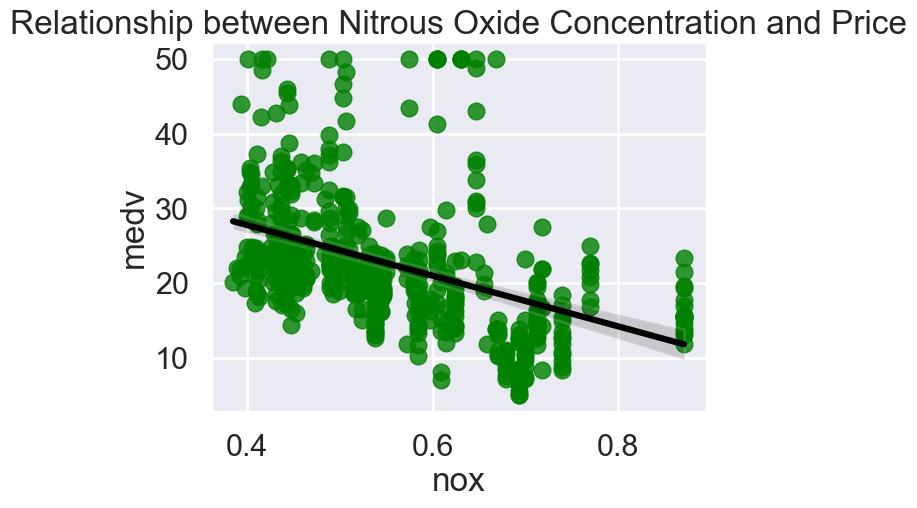

In [49]:
# Between prices and Nitrous Oxide Concentration
sns.regplot(y="medv",x="nox", data=df, fit_reg= True,line_kws={'color': 'black'}, scatter_kws={'color': 'green'})
plt.title("Relationship between Nitrous Oxide Concentration and Price")
plt.show()

### There is a strong negative correlation between NOX concentraation in air and price. The more/less concentration of NOX is in air the less/more the housing prices.

<AxesSubplot:xlabel='rad', ylabel='tax'>

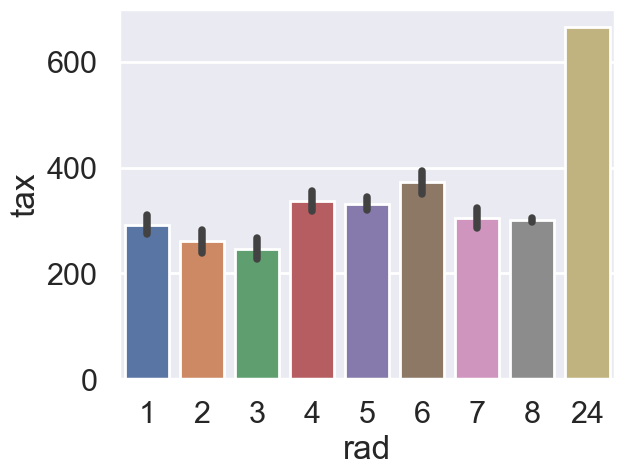

In [50]:
# The proportion of houses with a high tax rate by location
sns.barplot(x="rad", y="tax", data=df)

### Increasing trend in the average full-value property tax rate per 10,000 as the level of accessibility to radial highways increases

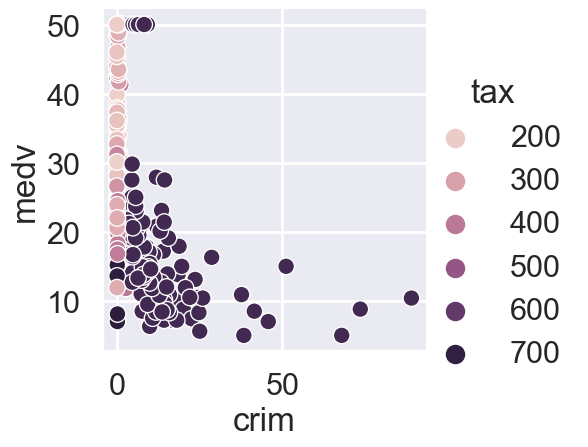

In [51]:
# median value vs. per capita crime rate, hue by high vs. low tax rate
sns.relplot(x="crim", y="medv", hue="tax", data=df)

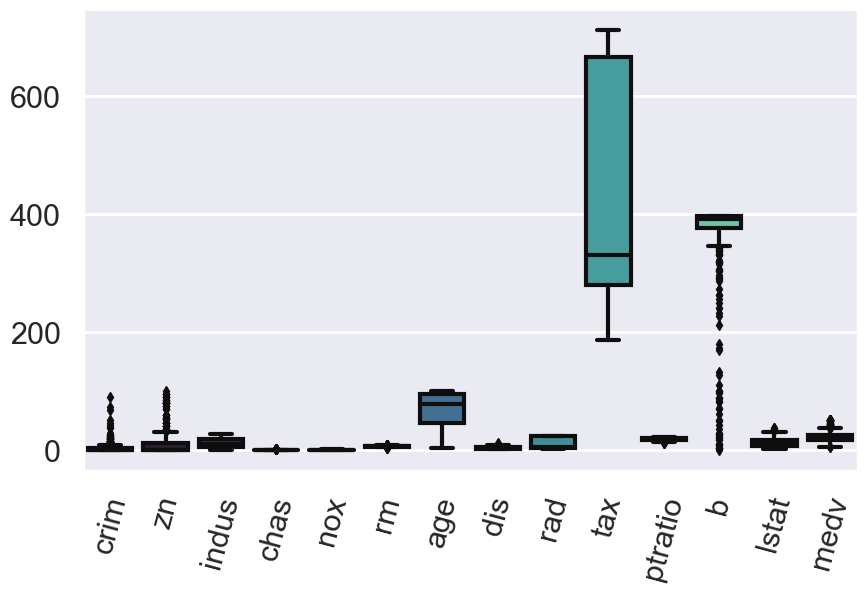

In [56]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, palette='mako')
plt.xticks(rotation=75)
plt.show()

### It shows the presence of outliers in some variables, such as "crim" and "nox"

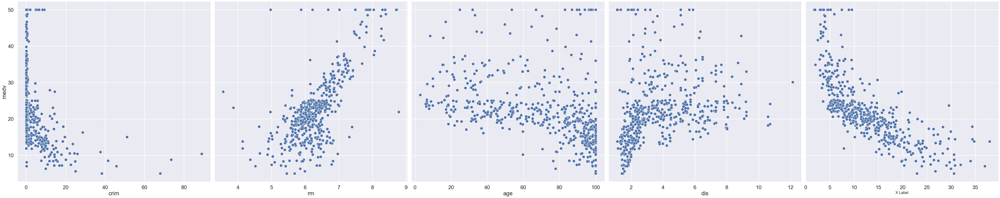

In [123]:
feature_names = ['crim','rm','age','dis','lstat']
sns.pairplot(df, x_vars=feature_names, y_vars=['medv'],height=12,aspect=1)

<AxesSubplot:>

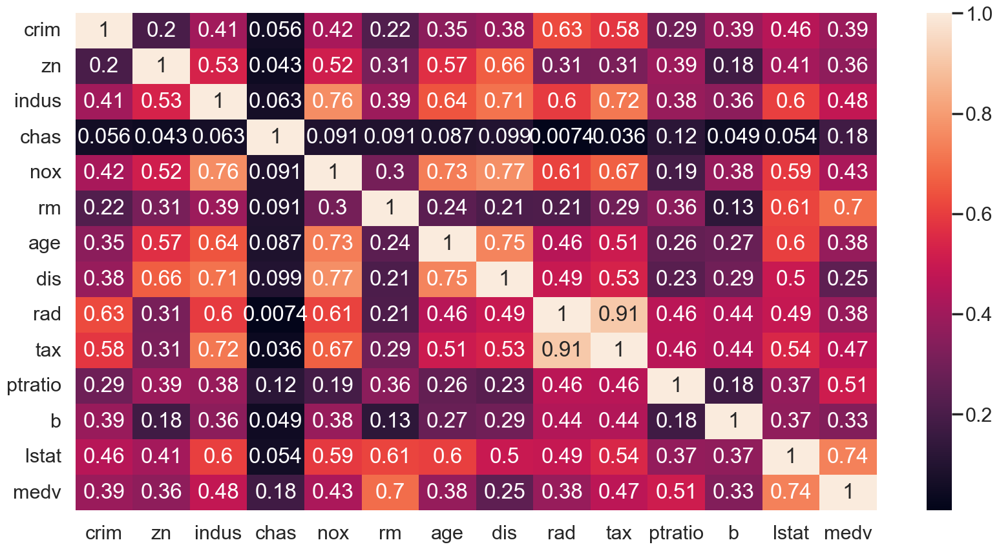

In [63]:
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr().abs(),annot=True)

### TAX and RAD are highly correlated features. RM has a strong positive correlation with MEDV (0.7) where as LSTAT has a high negative correlation with MEDV(-0.74).the features DIS and AGE which have a correlation of -0.75.

# More Observations

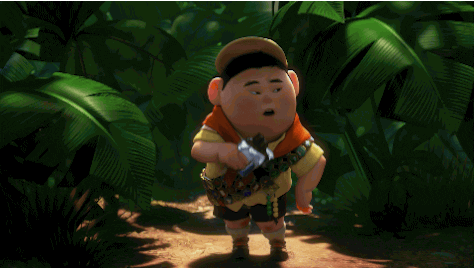

### Housing prices in Boston range from 5,000 to 50,000, with a median price of 21,200.
### The average number of rooms per house is 6.28, with a minimum of 3 and a maximum of 9.
### The crime rate ranges from 0.0063 to 88.9762, with a median of 0.2617.
### The distance to employment centers ranges from 1.13 to 12.13 miles, with a median of 3.17 miles.
### The dataset contains a total of 506 data points.
### The dataset contains 13 features, including the target variable (median value of owner-occupied homes).

# Done

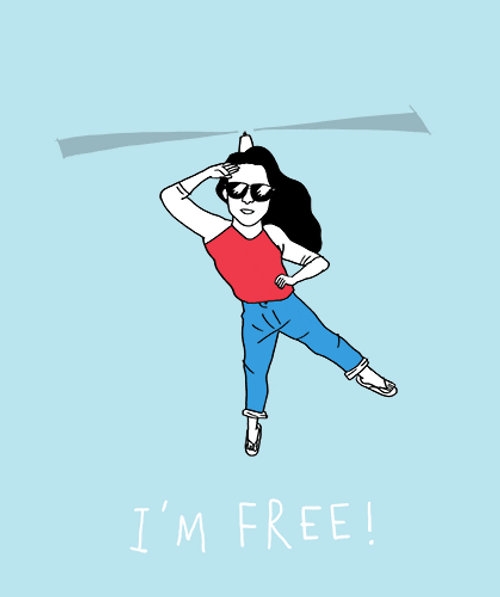